In [49]:


from sqlalchemy import create_engine
import pandas as pd

import yaml

In [50]:
class RDSDatabaseConnector:
    def __init__(self, credentials_file):
        self.credentials = self.load_credentials(credentials_file)
        self.engine = self._create_engine()

    def load_credentials(self, file_path):
        with open(file_path, 'r') as file:
            credentials = yaml.safe_load(file)
        return credentials

    def _create_engine(self):
        connection_str = f"postgresql://{self.credentials['RDS_USER']}:{self.credentials['RDS_PASSWORD']}@{self.credentials['RDS_HOST']}:{self.credentials['RDS_PORT']}/{self.credentials['RDS_DATABASE']}"
        engine = create_engine(connection_str)
        return engine
    
    def extract_data_from_table(self, table_name, schema='public'):
        query = f"SELECT * FROM {schema}.{table_name}"
        data = pd.read_sql_query(query, self.engine)
        return data
    
    def save_to_csv(self, data, file_path):
        df = pd.DataFrame(data)
        df.to_csv(file_path, index=False)


connector = RDSDatabaseConnector('/Users/ptm/Desktop/customer loans/credentials.yaml')


# Extracting data from the 'loan_payments' table into a pandas DataFrame
connect_data = connector.extract_data_from_table("loan_payments")

# Displaying the first few rows of the loan_payment DataFrame to ensure it has been extracted correctly 
if connect_data is not None:
    print("Data loaded successfully!")
    print(connect_data.head())  
else:
    print("Unable to load data. Check the table name or database connectivity.")

class DataTransform:
    def convert_columns_to_day_month_year(self, df, columns):
        for col in columns:
            df[col] = pd.to_datetime(df[col], format='%d-%m-%Y', errors='coerce')
        return df
    



Data loaded successfully!
         id  member_id  loan_amount  funded_amount  funded_amount_inv  \
0  38676116   41461848         8000         8000.0             8000.0   
1  38656203   41440010        13200        13200.0            13200.0   
2  38656154   41439961        16000        16000.0            16000.0   
3  38656128   41439934        15000        15000.0            15000.0   
4  38656121   41439927        15000        15000.0            15000.0   

        term  int_rate  instalment grade sub_grade  ... recoveries  \
0  36 months      7.49      248.82     A        A4  ...        0.0   
1  36 months      6.99      407.52     A        A3  ...        0.0   
2  36 months      7.49      497.63     A        A4  ...        0.0   
3  36 months     14.31      514.93     C        C4  ...        0.0   
4  36 months      6.03      456.54     A        A1  ...        0.0   

  collection_recovery_fee  last_payment_date last_payment_amount  \
0                     0.0           Jan-2022  

In [52]:

date_columns = ["last_payment_date", "next_payment_date", "last_credit_pull_date"]
selected_columns = connect_data[date_columns]

print(selected_columns)

print(selected_columns.head())



      last_payment_date next_payment_date last_credit_pull_date
0              Jan-2022          Feb-2022              Jan-2022
1              Jan-2022          Feb-2022              Jan-2022
2              Oct-2021              None              Oct-2021
3              Jun-2021              None              Jun-2021
4              Jan-2022          Feb-2022              Jan-2022
...                 ...               ...                   ...
54226          Jul-2016              None              Jul-2016
54227          Oct-2016              None              Sep-2016
54228          Sep-2016          Sep-2016              May-2013
54229          Mar-2014              None              May-2013
54230          Mar-2014          Dec-2014              Jan-2015

[54231 rows x 3 columns]
  last_payment_date next_payment_date last_credit_pull_date
0          Jan-2022          Feb-2022              Jan-2022
1          Jan-2022          Feb-2022              Jan-2022
2          Oct-2021       

In [53]:
# Using pandas to extract some data from the df to ensure the above code is functioning 

# Finding the row with the highest loan_amount
highest_loan_row = connect_data.loc[connect_data['loan_amount'].idxmax()]

# Getting the member_id from the row with the highest loan_amount
member_id_highest_loan = highest_loan_row['member_id']

print(f"The member_id with the highest loan_amount is: {member_id_highest_loan}")


The member_id with the highest loan_amount is: 41439638


In [54]:
# Dataframe info class that will help to extract information from my data frame 

class DataFrameInfo:
    def __init__(self, df):
        self.df = df

    def describe_columns(self):
        return self.df.dtypes

    def extract_statistics(self):
        return self.df.describe()

    def count_distinct_values(self):
        return self.df.nunique()

    def print_shape(self):
        print(f"DataFrame shape: {self.df.shape}")

    def count_null_values(self):
        null_counts = self.df.isnull().sum()
        null_percentage = (null_counts / len(self.df)) * 100
        return pd.DataFrame({'Null Count': null_counts, 'Null Percentage': null_percentage})


df_info = DataFrameInfo(connect_data)

print(df_info.describe_columns())



id                               int64
member_id                        int64
loan_amount                      int64
funded_amount                  float64
funded_amount_inv              float64
term                            object
int_rate                       float64
instalment                     float64
grade                           object
sub_grade                       object
employment_length               object
home_ownership                  object
annual_inc                     float64
verification_status             object
issue_date                      object
loan_status                     object
payment_plan                    object
purpose                         object
dti                            float64
delinq_2yrs                      int64
earliest_credit_line            object
inq_last_6mths                   int64
mths_since_last_delinq         float64
mths_since_last_record         float64
open_accounts                    int64
total_accounts           

In [55]:
# Printing a range of statistics of my columns in the df 

print(df_info.extract_statistics())


                 id     member_id   loan_amount  funded_amount  \
count  5.423100e+04  5.423100e+04  54231.000000   51224.000000   
mean   7.621797e+06  8.655350e+06  13333.076100   13229.509117   
std    9.571362e+06  1.031281e+07   8082.196709    8019.017599   
min    5.552100e+04  7.069400e+04    500.000000     500.000000   
25%    7.594330e+05  9.587720e+05   7000.000000    7000.000000   
50%    7.084590e+06  8.709873e+06  12000.000000   12000.000000   
75%    8.860616e+06  1.052714e+07  18000.000000   18000.000000   
max    3.867612e+07  4.146185e+07  35000.000000   35000.000000   

       funded_amount_inv      int_rate    instalment    annual_inc  \
count       54231.000000  49062.000000  54231.000000  5.423100e+04   
mean        12952.622979     13.507328    400.013953  7.222085e+04   
std          8099.473527      4.392893    238.920012  5.158934e+04   
min             0.000000      5.420000     15.670000  3.300000e+03   
25%          6700.000000     10.370000    224.205000  4

In [56]:

# Printing amount of disctint values of each column in the df 

print(df_info.count_distinct_values())


id                             54231
member_id                      54231
loan_amount                     1083
funded_amount                   1122
funded_amount_inv               5261
term                               2
int_rate                         457
instalment                     19940
grade                              7
sub_grade                         35
employment_length                 11
home_ownership                     5
annual_inc                      6132
verification_status                3
issue_date                        61
loan_status                        9
payment_plan                       2
purpose                           14
dti                             3611
delinq_2yrs                       16
earliest_credit_line             587
inq_last_6mths                    24
mths_since_last_delinq           100
mths_since_last_record           120
open_accounts                     48
total_accounts                    88
out_prncp                      17673
o

In [57]:
# Counting the null values in each column of my df 

print(df_info.count_null_values())

                             Null Count  Null Percentage
id                                    0         0.000000
member_id                             0         0.000000
loan_amount                           0         0.000000
funded_amount                      3007         5.544799
funded_amount_inv                     0         0.000000
term                               4772         8.799395
int_rate                           5169         9.531449
instalment                            0         0.000000
grade                                 0         0.000000
sub_grade                             0         0.000000
employment_length                  2118         3.905515
home_ownership                        0         0.000000
annual_inc                            0         0.000000
verification_status                   0         0.000000
issue_date                            0         0.000000
loan_status                           0         0.000000
payment_plan                   

In [58]:
# Printing the shape of the df

df_info.print_shape()

DataFrame shape: (54231, 43)


In [59]:

# Removing/imputing missing values in the data 

# The null values from each colum and the percentage 


print(df_info.count_null_values())


                             Null Count  Null Percentage
id                                    0         0.000000
member_id                             0         0.000000
loan_amount                           0         0.000000
funded_amount                      3007         5.544799
funded_amount_inv                     0         0.000000
term                               4772         8.799395
int_rate                           5169         9.531449
instalment                            0         0.000000
grade                                 0         0.000000
sub_grade                             0         0.000000
employment_length                  2118         3.905515
home_ownership                        0         0.000000
annual_inc                            0         0.000000
verification_status                   0         0.000000
issue_date                            0         0.000000
loan_status                           0         0.000000
payment_plan                   

In [69]:
# Creating the Plotter class and DataFrameTransform class - these will allow visualisations of the code 

import matplotlib.pyplot as plt

class Plotter:
    def visualise_nulls(self, data_frame):
        plt.figure(figsize=(10, 6))
        missing_vals = data_frame.isnull().sum()
        missing_vals[missing_vals > 0].sort_values().plot(kind='barh')
        plt.title('Missing Values per Column')
        plt.xlabel('Number of Missing Values')
        plt.ylabel('Columns')
        plt.show()



class DataFrameTransform:
    def __init__(self, data_frame):
        self.data_frame = data_frame

    def check_nulls(self):
        return self.data_frame.isnull().sum()

    def drop_columns(self, columns_to_drop):
        self.data_frame.drop(columns=columns_to_drop, inplace=True)

    def impute_missing_values(self, columns, strategy='median'):
        for col in columns:
            if self.data_frame[col].dtype == 'object':
                self.data_frame[col] = pd.to_datetime(self.data_frame[col], errors='coerce')
            else:
                if strategy == 'median':
                    self.data_frame[col].fillna(self.data_frame[col].median(), inplace=True)
                elif strategy == 'mean':
                    self.data_frame[col].fillna(self.data_frame[col].mean(), inplace=True)

    def identify_skewed_columns(self, threshold=0.5):
        numeric_columns = self.data_frame.select_dtypes(include=['float64', 'int64']).columns
        skewed_cols = []
        for col in numeric_columns:
            if abs(self.data_frame[col].skew()) > threshold:
                skewed_cols.append(col)
        return skewed_cols

Null Counts Before Dropping Columns:
id                                 0
member_id                          0
loan_amount                        0
funded_amount                   3007
funded_amount_inv                  0
term                            4772
int_rate                        5169
instalment                         0
grade                              0
sub_grade                          0
employment_length               2118
home_ownership                     0
annual_inc                         0
verification_status                0
issue_date                         0
loan_status                        0
payment_plan                       0
purpose                            0
dti                                0
delinq_2yrs                        0
earliest_credit_line               0
inq_last_6mths                     0
mths_since_last_delinq         31002
mths_since_last_record         48050
open_accounts                      0
total_accounts                     0
o

/var/folders/ht/w05_8ln10xd7k37w8p2lhzgm0000gn/T/ipykernel_77333/3868993166.py:28: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  self.data_frame[col] = pd.to_datetime(self.data_frame[col], errors='coerce')
/var/folders/ht/w05_8ln10xd7k37w8p2lhzgm0000gn/T/ipykernel_77333/3868993166.py:28: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  self.data_frame[col] = pd.to_datetime(self.data_frame[col], errors='coerce')


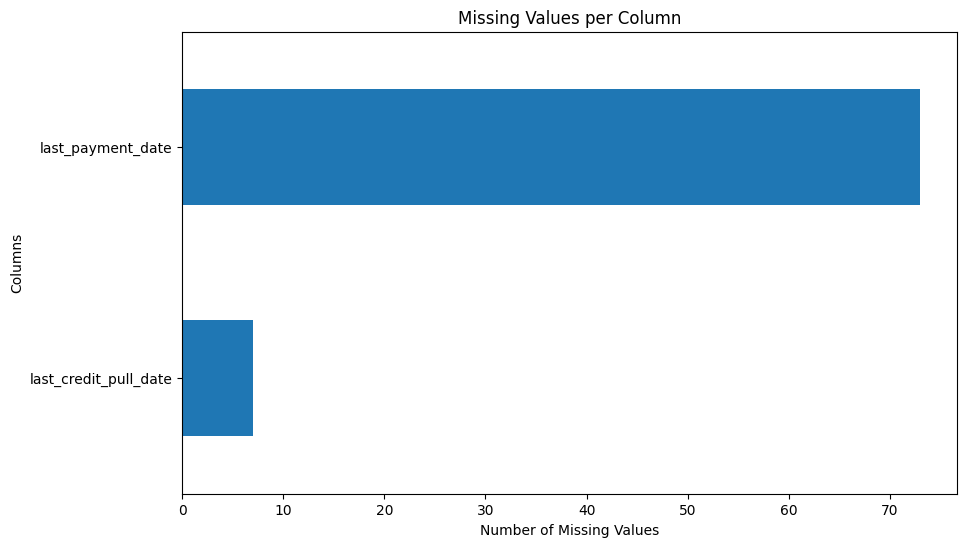

In [70]:

connector = RDSDatabaseConnector('/Users/ptm/Desktop/customer loans/credentials.yaml')
connect_data = connector.extract_data_from_table("loan_payments")

df_transformer = DataFrameTransform(connect_data)
plotter = Plotter()

# Determining the NULLs in each column and then dropping columns with NULLs, and visualise removal
null_counts_before = df_transformer.check_nulls()
print("Null Counts Before Dropping Columns:")
print(null_counts_before)

# Dropping the colums with nulls 
columns_to_drop = null_counts_before[null_counts_before > 1000].index.tolist()
df_transformer.drop_columns(columns_to_drop)

# Imputing the missing values 
columns_to_impute = connect_data.columns[connect_data.isnull().any()].tolist()
df_transformer.impute_missing_values(columns_to_impute, strategy='median')

# Checking NULLs after operations and visualize
null_counts_after = df_transformer.check_nulls()
print("\nNull Counts After Imputation:")
print(null_counts_after)
plotter.visualise_nulls(connect_data)





In [80]:

class DataFrameTransform:
    def __init__(self, data_frame):
        self.data_frame = data_frame

    def identify_skewed_columns(self, threshold=0.5):
        numeric_columns = self.data_frame.select_dtypes(include=['float64', 'int64']).columns
        skewed_cols = []
        for col in numeric_columns:
            if abs(self.data_frame[col].skew()) > threshold:
                skewed_cols.append(col)
        return skewed_cols

    def reduce_skewness(self, columns):
        transformations = {}
        for col in columns:
            self.data_frame[col] = np.log1p(self.data_frame[col])
            transformations[col] = self.data_frame[col].copy()  
        return transformations

    def apply_transformations(self, transformations):
        for col, transform in transformations.items():
            self.data_frame[col] = transform



transformer = DataFrameTransform(connect_data)

# applying transformations to reduce skewness
skewed_columns = transformer.identify_skewed_columns(threshold=0.5)
transformations = transformer.reduce_skewness(skewed_columns)
transformer.apply_transformations(transformations)



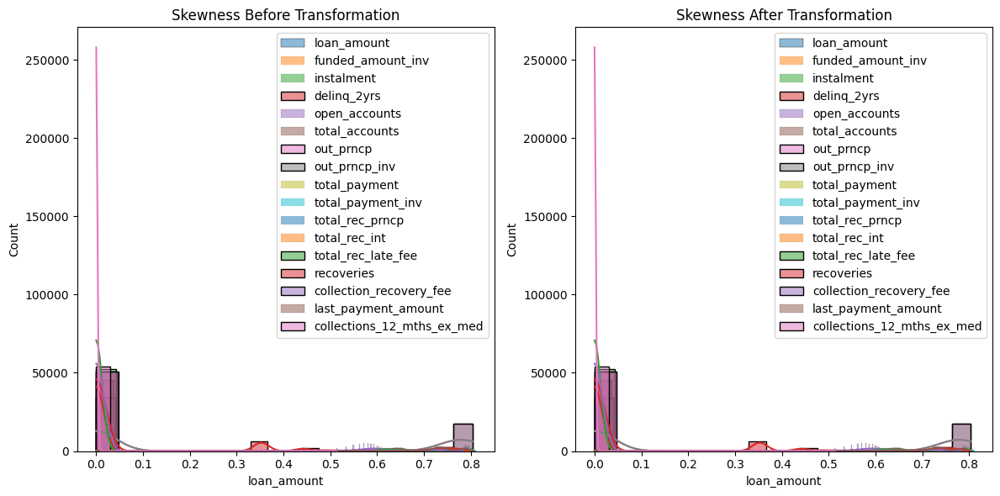

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

# Creating two separate subplots for 'Before Transformation' and 'After Transformation'
plt.subplot(1, 2, 1)
for col in skewed_columns:
    sns.histplot(transformer.data_frame[col], kde=True, label=col)
plt.title('Skewness Before Transformation')
plt.legend()

plt.subplot(1, 2, 2)
for col in skewed_columns:
    sns.histplot(transformations[col], kde=True, label=col)
plt.title('Skewness After Transformation')
plt.legend()

plt.tight_layout()
plt.show()


/var/folders/ht/w05_8ln10xd7k37w8p2lhzgm0000gn/T/ipykernel_77333/4261005435.py:12: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


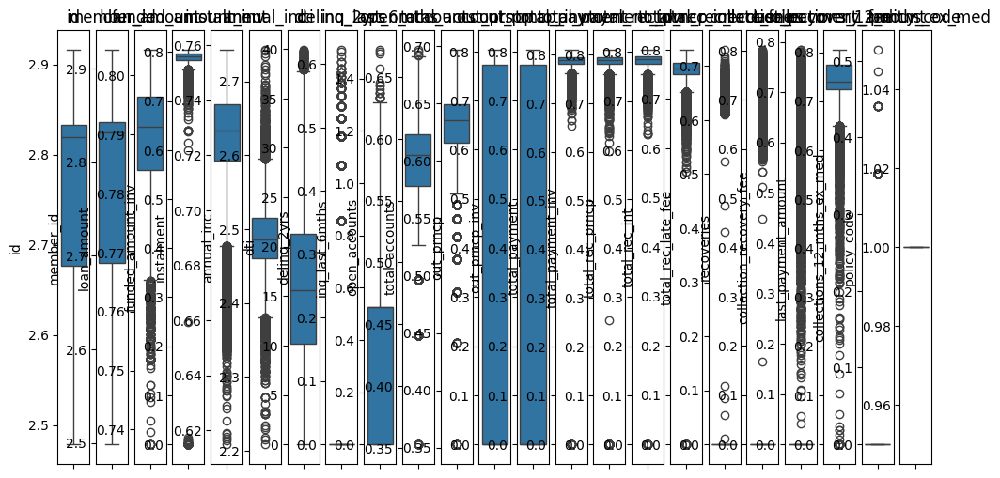

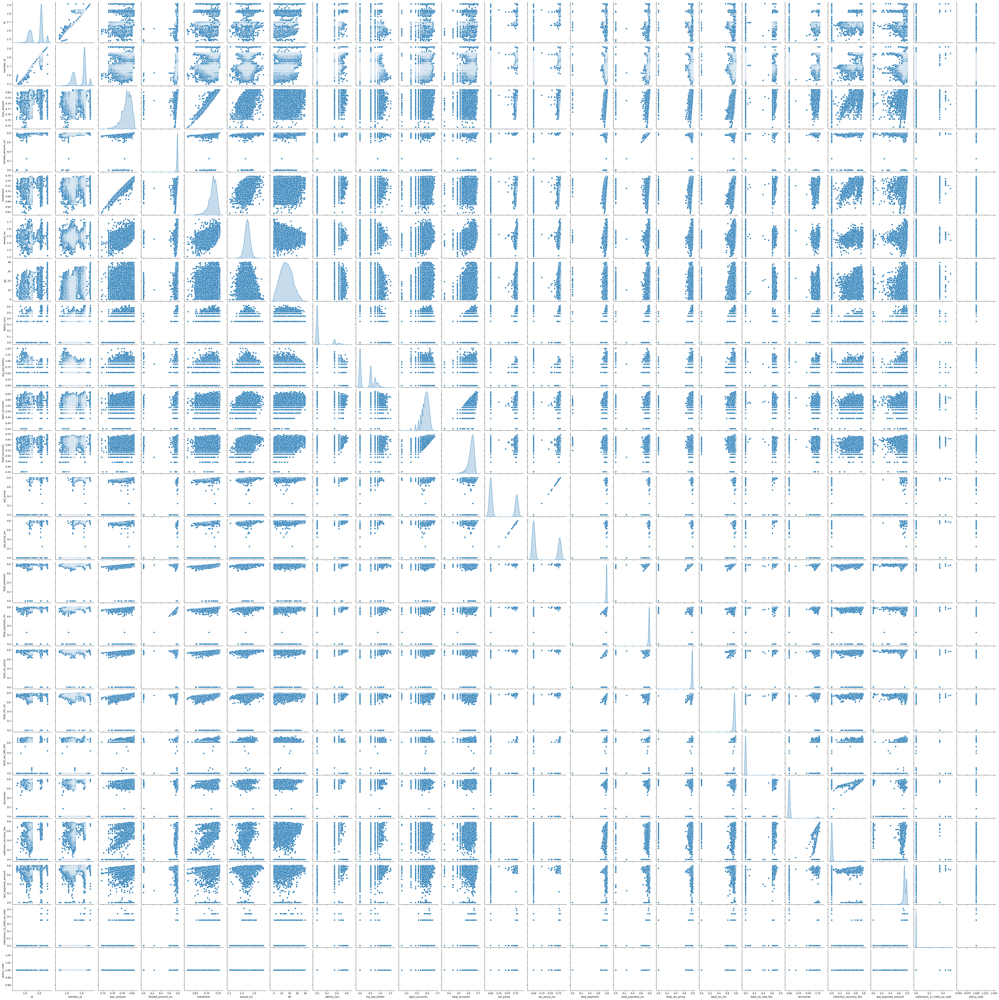

In [97]:

class Plotter:
    def visualise_data(self, data):
        sns.pairplot(data, diag_kind='kde')
    
    def plot_boxplots(self, data):
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        plt.figure(figsize=(12, 6))
        for i, col in enumerate(numeric_columns, 1):
            plt.subplot(1, len(numeric_columns), i)
            sns.boxplot(y=data[col])
            plt.title(col)
        plt.tight_layout()
        plt.show()


plotter = Plotter()
plotter.plot_boxplots(connect_data) 



class DataFrameTransform:
    def __init__(self, data_frame):
        self.data_frame = data_frame

    def identify_outliers(self, columns, threshold=2.0):
        outliers = {}
        for col in columns:
            z_scores = (self.data_frame[col] - self.data_frame[col].mean()) / self.data_frame[col].std()
            col_outliers = self.data_frame[abs(z_scores) > threshold]
            outliers[col] = col_outliers
        return outliers

    def remove_outliers(self, outliers):
        for col, outlier_data in outliers.items():
            self.data_frame = self.data_frame[~self.data_frame.isin(outlier_data)].dropna()

plotter = Plotter()  
plotter.visualise_data(connect_data)  





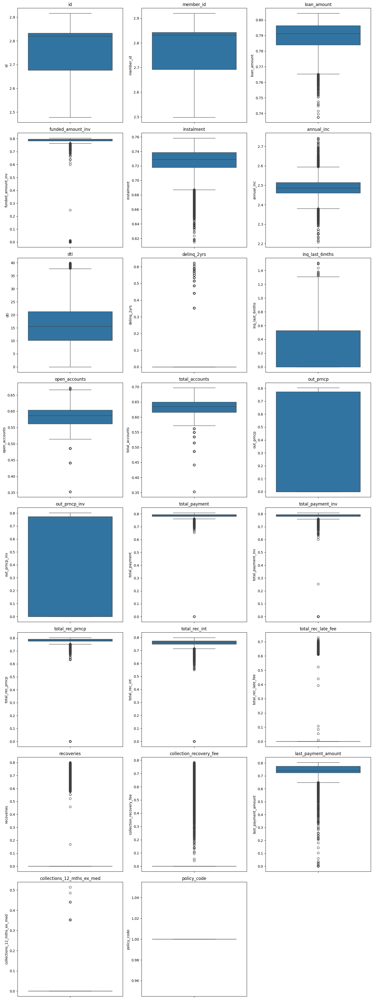

In [98]:
# Above plotter function for box plot gave a cluttered layout - adjusting the organisation of the box plots

class Plotter:
    def visualise_data(self, data):
        sns.pairplot(data, diag_kind='kde')
    
    def plot_boxplots(self, data):
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        num_plots = len(numeric_columns)
        num_rows = (num_plots // 3) + (num_plots % 3 > 0)  
        plt.figure(figsize=(15, 5 * num_rows))  
        
        for i, col in enumerate(numeric_columns, 1):
            plt.subplot(num_rows, 3, i)
            sns.boxplot(y=data[col])
            plt.title(col, fontsize=12)  
            plt.xlabel('')  

        plt.tight_layout()
        plt.show()

# Prints out a much more clearer box plots which are easy to read and use for project 
plotter = Plotter()
plotter.plot_boxplots(connect_data)  

In [104]:
# Check if the class is properly initialized and outlier_columns match DataFrame columns
print(transformer)
print(connect_data.columns)
print(outlier_columns)

transformer = DataFrameTransform(connect_data)

# Verifying that the method calls 
outliers = transformer.identify_outliers(outlier_columns)
print(outliers)

transformer.remove_outliers(outliers)


Index(['id', 'member_id', 'loan_amount', 'funded_amount_inv', 'instalment',
       'grade', 'sub_grade', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_date', 'loan_status', 'payment_plan',
       'purpose', 'dti', 'delinq_2yrs', 'earliest_credit_line',
       'inq_last_6mths', 'open_accounts', 'total_accounts', 'out_prncp',
       'out_prncp_inv', 'total_payment', 'total_payment_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_payment_date', 'last_payment_amount',
       'last_credit_pull_date', 'collections_12_mths_ex_med', 'policy_code',
       'application_type'],
      dtype='object')
['loan_amount', 'funded_amount_inv', 'instalment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_accounts', 'total_accounts', 'out_prncp', 'out_prncp_inv', 'total_payment', 'total_payment_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee'

In [105]:


outlier_columns = ['loan_amount', 'funded_amount_inv', 'instalment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_accounts', 'total_accounts', 'out_prncp', 'out_prncp_inv', 'total_payment', 'total_payment_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_payment_amount', 'collections_12_mths_ex_med']

# Identifing outliers
outliers = transformer.identify_outliers(outlier_columns)

# Removing outliers
transformer.remove_outliers(outliers)




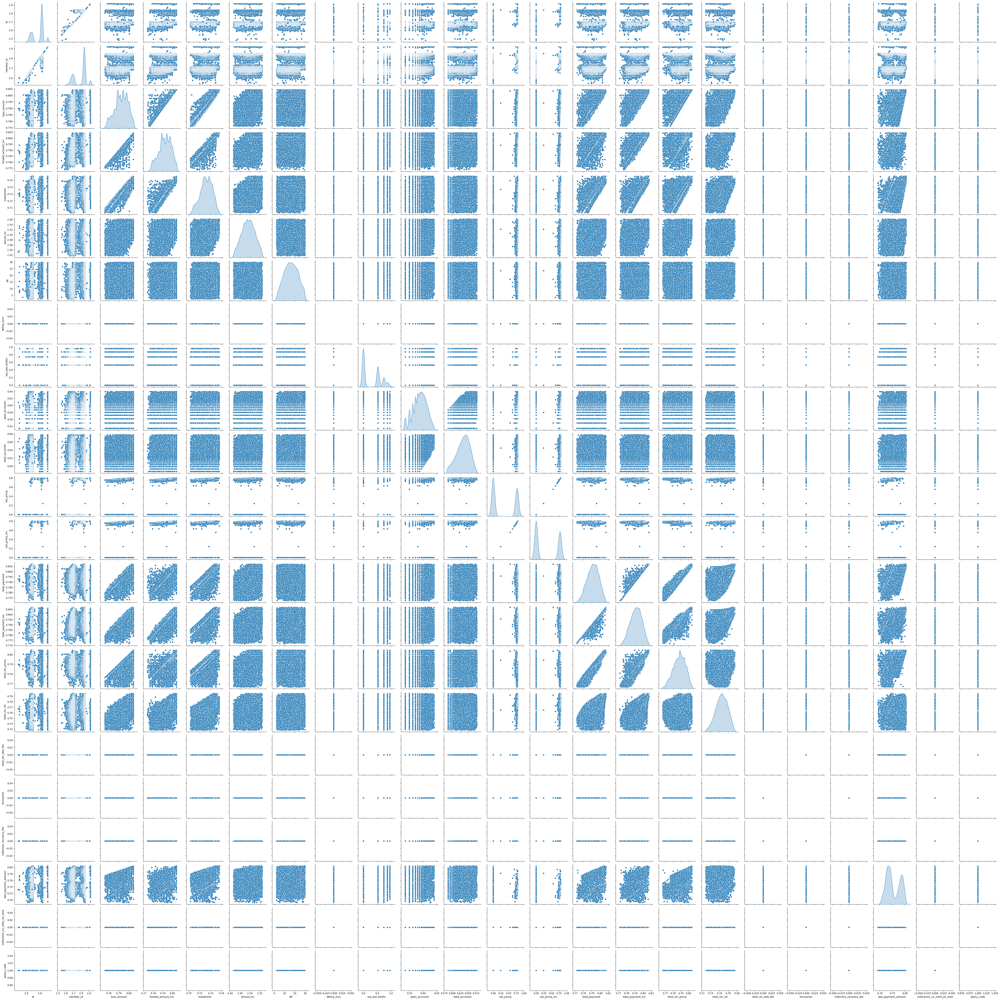

In [106]:
# visualises the outliers 

plotter.visualise_data(transformer.data_frame) 

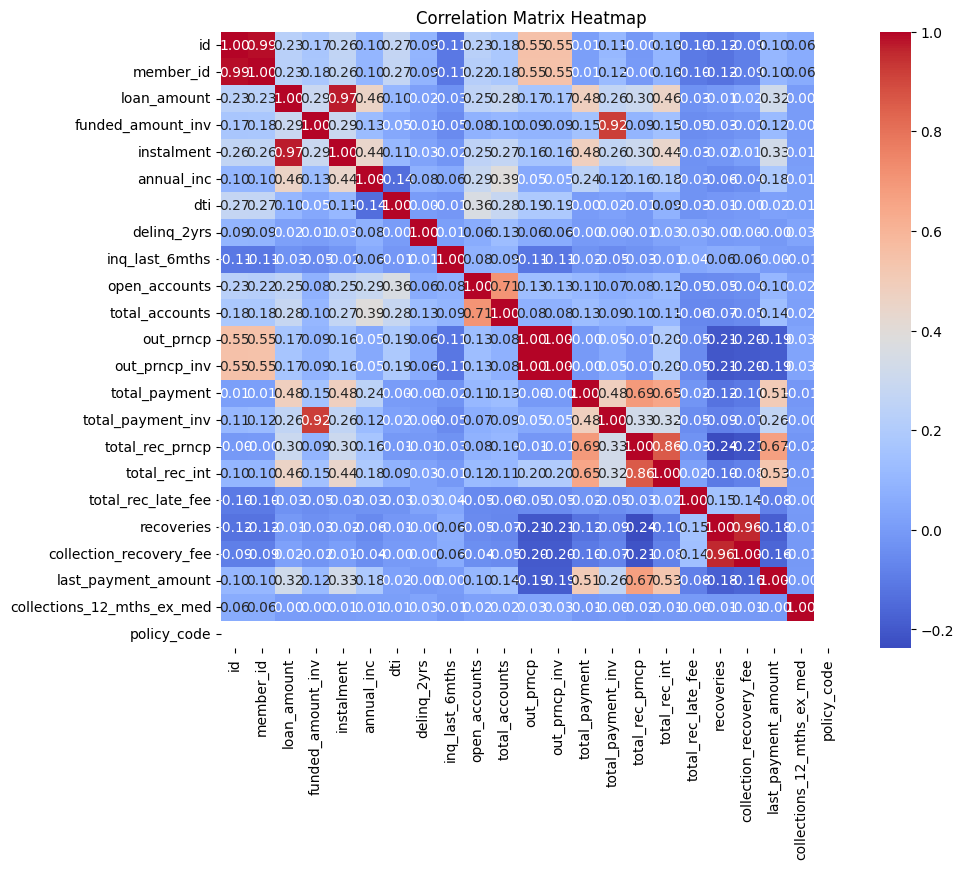

In [108]:
# computing a correlation matrix for the df 

numeric_columns = connect_data.select_dtypes(include=['float64', 'int64'])


correlation_matrix = numeric_columns.corr()

# Visualising the correlation matrix using a heatmap as suggested 
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()





In [109]:
# Setting a threshold -- used google for suggestion of a preferred threshold based on other data sets similar to this 
threshold = 0.7  

# Finding  columns with correlation above the threshold
highly_correlated_cols = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            highly_correlated_cols.add(colname)

# Printing highly correlated columns
print("Highly correlated columns:", highly_correlated_cols)


Highly correlated columns: {'collection_recovery_fee', 'out_prncp_inv', 'member_id', 'instalment', 'total_accounts', 'total_payment_inv', 'total_rec_int'}


In [112]:
# Removing 'out_prncp_inv' from the data set 
connect_data_filtered = connect_data.drop(columns=['out_prncp', 'total_payment_inv'], axis=1)


In [114]:
#checking the the colums have been dropped 

print(connect_data_filtered.columns)


Index(['id', 'member_id', 'loan_amount', 'funded_amount_inv', 'instalment',
       'grade', 'sub_grade', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_date', 'loan_status', 'payment_plan',
       'purpose', 'dti', 'delinq_2yrs', 'earliest_credit_line',
       'inq_last_6mths', 'open_accounts', 'total_accounts', 'out_prncp_inv',
       'total_payment', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_payment_date', 'last_payment_amount', 'last_credit_pull_date',
       'collections_12_mths_ex_med', 'policy_code', 'application_type'],
      dtype='object')
